<a id='1'>1. Import the necessary libraries</a>

In [ ]:
paths=['/content/BrightDataset']    ### Please change the directory as per method  ['/content/GammaDataset','/content/GaussDataset','/content/BrightDataset']

In [5]:
!pip install torchsummary
!pip install imgaug
!pip install opendatasets

In [6]:
from IPython.core.interactiveshell import InteractiveShell
import seaborn as sns
# PyTorch
import torchvision
from torchvision import transforms, datasets, models
import torch
from torch import optim, cuda
from torch.utils.data import DataLoader, sampler
import torch.nn as nn

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
from matplotlib import pyplot as plt
# Data science tools
import numpy as np
import pandas as pd
import os

# Image manipulations
from PIL import Image
# Useful for examining network
from torchsummary import summary
# Timing utility
from timeit import default_timer as timer

# Visualizations
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['font.size'] = 14

# Printing out all outputs
InteractiveShell.ast_node_interactivity = 'all'
import os
from PIL import Image  
import PIL  
import opendatasets as od
import cv2
import imageio
import imgaug as ia
import imgaug.augmenters as iaa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib
%matplotlib inline
from google.colab.patches import cv2_imshow

Please provide kaggle credentials to download the data set

In [7]:
import opendatasets as od
DS=od.download('https://www.kaggle.com/paultimothymooney/chest-xray-pneumonia')

100%|██████████| 2.29G/2.29G [00:11<00:00, 209MB/s]


In [8]:
folders=['test/NORMAL','test/PNEUMONIA','train/NORMAL','train/PNEUMONIA','val/NORMAL','val/PNEUMONIA']
for ele in folders:
      path=os.path.join('/content/chest-xray-pneumonia/chest_xray/',ele)
      print(ele,end=' ')
      dir=os.listdir(path)
      count=0
      for ele in dir:
       
        count=count+1
      print(count,end='\n')

test/NORMAL 234
test/PNEUMONIA 390
train/NORMAL 1341
train/PNEUMONIA 3875
val/NORMAL 8
val/PNEUMONIA 8


In [9]:
!mkdir GammaDataset
!mkdir GaussDataset
!mkdir BrightDataset

mkdir: cannot create directory ‘GammaDataset’: File exists
mkdir: cannot create directory ‘GaussDataset’: File exists
mkdir: cannot create directory ‘BrightDataset’: File exists


In [10]:
# folders=['test/NORMAL','test/PNEUMONIA','train/NORMAL','train/PNEUMONIA','val/NORMAL','val/PNEUMONIA']
fold=['test','train','val']
Types=['NORMAL','PNEUMONIA']
pathsF=['/content/GammaDataset','/content/GaussDataset','/content/BrightDataset']
for path in pathsF:
  for ele in fold:
      dir=os.path.join(path,ele)
      os.mkdir(dir)
      for el in Types:
          temp=os.path.join(dir,el)
          os.mkdir(temp)

In [11]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

def get_cdf_hist(image_input):
    """
    Method to compute histogram and cumulative distribution function
    :param image_input: input image
    :return: cdf
    """
    hist, bins = np.histogram(image_input.flatten(), 256, [0, 256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * float(hist.max()) / cdf.max()
    return cdf_normalized


def contrast_brightness(image, alpha, beta):
    """
    Linear transformation function to enhance brightness and contrast
    :param image: input image
    :param alpha: contrast factor
    :param beta: brightness factor
    :return: enhanced image
    """
    enhanced_image = np.array(alpha*image + beta)
    enhanced_image[enhanced_image > 255] = 255
    cdf = get_cdf_hist(enhanced_image)
    return enhanced_image, cdf


def gamma_enhancement(image, gamma):
    """
    Non-linear transformation function to enhance brightness and contrast
    :param image: input image
    :param gamma: contrast enhancement factor
    :return: enhanced image
    """
    normalized_image = image / np.max(image)
    enhanced_image = np.power(normalized_image, gamma)
    enhanced_image = enhanced_image * 255
    cdf = get_cdf_hist(enhanced_image)
    return enhanced_image, cdf

def gauss_enhancement(image, gain):
    """
    Non-linear transformation function to enhance brightness and contrast
    :param image: input image
    :param gain: contrast enhancement factor
    :return: enhanced image
    """
    normalized_image = image / np.max(image)
    enhanced_image = 1 - np.exp(-normalized_image**2/gain)
    enhanced_image = enhanced_image*255
    cdf = get_cdf_hist(enhanced_image)
    return enhanced_image, cdf

To disply some sample contrasted images 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<Figure size 720x504 with 0 Axes>

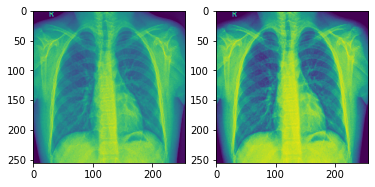

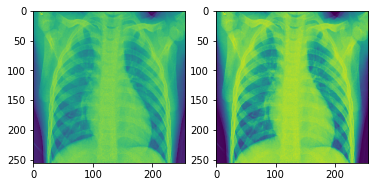

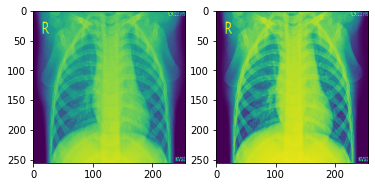

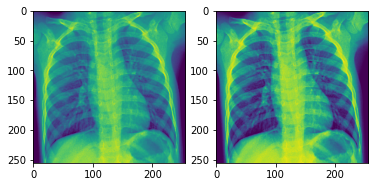

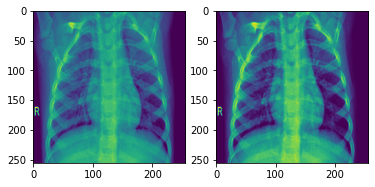

...

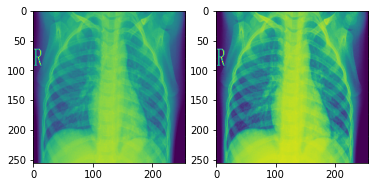

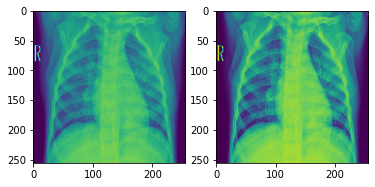

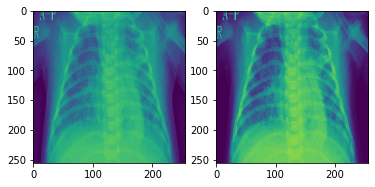

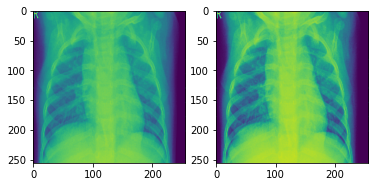

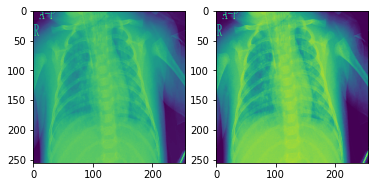

In [13]:

Paths=[]
paths=['/content/BrightDataset']
fold=['test','train','val']
Types=['NORMAL','PNEUMONIA']
fig = plt.figure(figsize=(10, 7))
for path in paths:
    for ele in fold:
        for el in Types: 
            dir='/content/chest-xray-pneumonia/chest_xray'+'/'+str(ele)+'/'+str(el)
            dir_new=path+'/'+str(ele)+'/'+str(el)
            c=0
            for root in os.listdir(dir):
                 image=cv2.imread(dir+'/'+str(root),cv2.IMREAD_GRAYSCALE)
                 image=cv2.resize(image, (256,256))
                 enhanced_clahe, cdf_clahe = contrast_brightness(image, 25, 25)   ### Please change the type of contrast enhancement method as per requirment
                 fig = plt.figure()
                 ax1 = fig.add_subplot(1,2,1)
                 ax1.imshow(image)
                 ax2 = fig.add_subplot(1,2,2)
                 ax2.imshow(enhanced_clahe)
                 c=c+1
                 if c==25:
                   break 

                    

# Data Augumentation

In [14]:
fold=['test','train','val']
Types=['NORMAL','PNEUMONIA']
fig = plt.figure(figsize=(10, 7))
for path in paths:
    for ele in fold:
        for el in Types: 
            dir='/content/chest-xray-pneumonia/chest_xray'+'/'+str(ele)+'/'+str(el)
            dir_new=path+'/'+str(ele)+'/'+str(el)
            for root in os.listdir(dir):
                  image=cv2.imread(dir+'/'+str(root),cv2.IMREAD_GRAYSCALE)
                  image=cv2.resize(image,(255,255))
                  k=cv2.imwrite(os.path.join(dir_new,root+'O')+'.jpeg',image)
                  rotate=iaa.Affine(rotate=(-50, 30))
                  rotated_image=rotate.augment_image(image)
                  k=cv2.imwrite(os.path.join(dir_new,root+'R')+'.jpeg',rotated_image)
                  gaussian_noise=iaa.AdditiveGaussianNoise(10,20)
                  noise_image=gaussian_noise.augment_image(image)
                  k=cv2.imwrite(os.path.join(dir_new,root+'N')+'.jpeg',noise_image)
                  flip_hr=iaa.Fliplr(p=1.0)
                  flip_hr_image= flip_hr.augment_image(image)
                  k=cv2.imwrite(os.path.join(dir_new,root+'flip_hr')+'.jpeg',flip_hr_image)
                  flip_vr=iaa.Flipud(p=1.0)
                  flip_vr_image= flip_vr.augment_image(image)
                  k=cv2.imwrite(os.path.join(dir_new,root+'flip_vr')+'.jpeg',flip_vr_image)

<Figure size 720x504 with 0 Axes>

# Contrast Enhancement   {Alert Provide type of enhancement}

In [15]:
fold=['test','train','val']
Types=['NORMAL','PNEUMONIA']
fig = plt.figure(figsize=(10, 7))
for path in paths:
    for ele in fold:
        for el in Types: 
            dir='/content/chest-xray-pneumonia/chest_xray'+'/'+str(ele)+'/'+str(el)
            dir_new=path+'/'+str(ele)+'/'+str(el)
            for root in os.listdir(dir):
                 image=cv2.imread(dir+'/'+str(root),cv2.IMREAD_GRAYSCALE)
                 image=cv2.resize(image, (256,256))
                 enhanced_clahe, cdf_clahe = contrast_brightness(image, alpha=1, beta=25)      ###### Please Provide the type of enhancement 
                 k=cv2.imwrite(os.path.join(dir_new,root)+'.jpeg',enhanced_clahe)

<Figure size 720x504 with 0 Axes>

Printing the count of images 

In [16]:
folders=['test/NORMAL','test/PNEUMONIA','train/NORMAL','train/PNEUMONIA','val/NORMAL','val/PNEUMONIA']
for ele in folders:
      path=os.path.join(paths,ele)                            ###########################   ALERT change the directory as per requirement
      print(ele,end=' ')
      dir=os.listdir(path)
      count=0
      for ele in dir:
        count=count+1
      print(count,end='\n')

test/NORMAL 1404
test/PNEUMONIA 2340
train/NORMAL 8046
train/PNEUMONIA 23250
val/NORMAL 48
val/PNEUMONIA 48


In [17]:
#!kaggle kernels output dnik007/pneumonia-detection-using-pytorch 
#https://www.kaggle.com/dnik007/pneumonia-detection-using-pytorch/data
#!pip install kaggle
#!pip install kaggle --upgrade

<a id='2'>2. Read the dataset</a>

As we can see, the dataset has been divided into train, validation and test folders.

In [18]:
datadir = paths
traindir = datadir + '/train/'
validdir = datadir + '/val/'
testdir = datadir + '/test/'

In [19]:
save_file_name = 'vgg16-chest-4.pt'
checkpoint_path = 'vgg16-chest-4.pth'

# Change to fit hardware
batch_size = 128

# Whether to train on a gpu
train_on_gpu = cuda.is_available()
print(f'Train on gpu: {train_on_gpu}')

# Number of gpus
if train_on_gpu:
    gpu_count = cuda.device_count()
    print(f'{gpu_count} gpus detected.')
    if gpu_count > 1:
        multi_gpu = True
    else:
        multi_gpu = False

Train on gpu: True
1 gpus detected.


<a id='3'>3. Exploration of the data </a>

In [20]:
# Empty lists
categories = []
img_categories = []
n_train = []
n_valid = []
n_test = []
hs = []
ws = []
# Iterate through each category
for d in os.listdir(traindir):
    if not d.startswith('.'):
        categories.append(d)
        # Number of each image
        train_imgs = os.listdir(traindir + d)
        valid_imgs = os.listdir(validdir + d)
        test_imgs = os.listdir(testdir + d)
        n_train.append(len(train_imgs))
        n_valid.append(len(valid_imgs))
        n_test.append(len(test_imgs))

        # Find stats for train images
        for i in train_imgs:
            if not i.startswith('.'):
                img_categories.append(d)
                img = Image.open(traindir + d + '/' + i)
                img_array = np.array(img)
                # Shape
                hs.append(img_array.shape[0])
                ws.append(img_array.shape[1])

# Dataframe of categories
cat_df = pd.DataFrame({'category': categories,
                       'n_train': n_train,
                       'n_valid': n_valid, 'n_test': n_test}).\
    sort_values('category')

Let's see some images

<a id='4'>4. Image loaders</a>

In [21]:
image_transforms = {
    # Train uses data augmentation
    'train':
    transforms.Compose([
        transforms.Resize(size=255),
        # transforms.RandomResizedCrop(size=256, scale=(0.8, 1.0)),
        # transforms.RandomRotation(degrees=15),
        # transforms.ColorJitter(),
        # transforms.RandomHorizontalFlip(),
        # transforms.CenterCrop(size=224),  # Image net standards
        transforms.ToTensor(),

    ]),
    # Validation does not use augmentation
    'val':
    transforms.Compose([
        transforms.Resize(size=255),
        # transforms.CenterCrop(size=224),
        transforms.ToTensor(),
        # transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    # Test does not use augmentation
    'test':
    transforms.Compose([
        transforms.Resize(size=255),
        # transforms.CenterCrop(size=224),
        transforms.ToTensor(),
        # transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

In [22]:
data = {
    'train':
    datasets.ImageFolder(root=traindir, transform=image_transforms['train']),
    'val':
    datasets.ImageFolder(root=validdir, transform=image_transforms['val']),
    'test':
    datasets.ImageFolder(root=testdir, transform=image_transforms['test'])
}

# Dataloader iterators
dataloaders = {
    'train': DataLoader(data['train'], batch_size=batch_size, shuffle=True),
    'val': DataLoader(data['val'], batch_size=batch_size, shuffle=True),
    'test': DataLoader(data['test'], batch_size=8, shuffle=True)
}

In [23]:
trainiter = iter(dataloaders['train'])
features, labels = next(trainiter)
features.shape, labels.shape

(torch.Size([128, 3, 255, 255]), torch.Size([128]))

In [24]:
n_classes = len(cat_df)
print(f'There are {n_classes} different classes.')

len(data['train'].classes)

There are 2 different classes.


2

In [25]:
 model = models.vgg16(pretrained=True)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Freeze the early layers

In [26]:
for param in model.parameters():
    param.requires_grad = False

In [27]:
n_inputs = model.classifier[6].in_features

# Add on classifier
model.classifier[6] = nn.Sequential(
    nn.Linear(n_inputs, 256), nn.ReLU(), nn.Dropout(0.4),
    nn.Linear(256, n_classes), nn.LogSoftmax(dim=1))

model.classifier

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Sequential(
    (0): Linear(in_features=4096, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.4, inplace=False)
    (3): Linear(in_features=256, out_features=2, bias=True)
    (4): LogSoftmax(dim=1)
  )
)

In [28]:
total_params = sum(p.numel() for p in model.parameters())
print(f'{total_params:,} total parameters.')
total_trainable_params = sum(
    p.numel() for p in model.parameters() if p.requires_grad)
print(f'{total_trainable_params:,} training parameters.')

135,309,890 total parameters.
1,049,346 training parameters.


**Moving to GPU**

In [29]:
if train_on_gpu:
    model = model.to('cuda')

if multi_gpu:
    model = nn.DataParallel(model)

Load the pre-trained model

In [30]:
def get_pretrained_model(model_name):
    """Retrieve a pre-trained model from torchvision

    Params
    -------
        model_name (str): name of the model (currently only accepts vgg16 and resnet50)

    Return
    --------
        model (PyTorch model): cnn

    """

    if model_name == 'vgg16':
        model = models.vgg16(pretrained=True)

        # Freeze early layers
        for param in model.parameters():
            param.requires_grad = False
        n_inputs = model.classifier[6].in_features

        # Add on classifier
        model.classifier[6] = nn.Sequential(
            nn.Linear(n_inputs, 256), nn.ReLU(), nn.Dropout(0.2),
            nn.Linear(256, n_classes), nn.LogSoftmax(dim=1))

    elif model_name == 'resnet50':
        model = models.resnet50(pretrained=True)

        for param in model.parameters():
            param.requires_grad = False

        n_inputs = model.fc.in_features
        model.fc = nn.Sequential(
            nn.Linear(n_inputs, 256), nn.ReLU(), nn.Dropout(0.2),
            nn.Linear(256, n_classes), nn.LogSoftmax(dim=1))

    # Move to gpu and parallelize
    if train_on_gpu:
        model = model.to('cuda')

    if multi_gpu:
        model = nn.DataParallel(model)

    return model

In [31]:
model = get_pretrained_model('vgg16')
if multi_gpu:
    summary(
        model.module,
        input_size=(3, 224, 224),
        batch_size=batch_size,
        device='cuda')
else:
    summary(
        model, input_size=(3, 224, 224), batch_size=batch_size, device='cuda')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1        [128, 64, 224, 224]           1,792
              ReLU-2        [128, 64, 224, 224]               0
            Conv2d-3        [128, 64, 224, 224]          36,928
              ReLU-4        [128, 64, 224, 224]               0
         MaxPool2d-5        [128, 64, 112, 112]               0
            Conv2d-6       [128, 128, 112, 112]          73,856
              ReLU-7       [128, 128, 112, 112]               0
            Conv2d-8       [128, 128, 112, 112]         147,584
              ReLU-9       [128, 128, 112, 112]               0
        MaxPool2d-10         [128, 128, 56, 56]               0
           Conv2d-11         [128, 256, 56, 56]         295,168
             ReLU-12         [128, 256, 56, 56]               0
           Conv2d-13         [128, 256, 56, 56]         590,080
             ReLU-14         [128, 256,

Mapping of Classes to Indexes

In [32]:
model.class_to_idx = data['train'].class_to_idx
model.idx_to_class = {
    idx: class_
    for class_, idx in model.class_to_idx.items()
}

list(model.idx_to_class.items())

[(0, 'NORMAL'), (1, 'PNEUMONIA')]

**Training Loss and Optimizer:** The loss is the negative log likelihood and the optimizer is the Adam optimizer.

In [33]:
criterion = nn.NLLLoss()
optimizer = optim.Adam(model.parameters())

for p in optimizer.param_groups[0]['params']:
    if p.requires_grad:
        print(p.shape)

torch.Size([256, 4096])
torch.Size([256])
torch.Size([2, 256])
torch.Size([2])


In [34]:

def train(model,
          criterion,
          optimizer,
          train_loader,
          valid_loader,
          save_file_name,
          max_epochs_stop=3,
          n_epochs=20,
          print_every=2):
    # Early stopping intialization
    epochs_no_improve = 0
    valid_loss_min = np.Inf

    valid_max_acc = 0
    history = []

    # Number of epochs already trained (if using loaded in model weights)
    try:
        print(f'Model has been trained for: {model.epochs} epochs.\n')
    except:
        model.epochs = 0
        print(f'Starting Training from Scratch.\n')

    overall_start = timer()

    # Main loop
    for epoch in range(n_epochs):

        # keep track of training and validation loss each epoch
        train_loss = 0.0
        valid_loss = 0.0

        train_acc = 0
        valid_acc = 0

        # Set to training
        model.train()
        start = timer()

        # Training loop
        for ii, (data, target) in enumerate(train_loader):
            # Tensors to gpu
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()

            # Clear gradients
            optimizer.zero_grad()
            # Predicted outputs are log probabilities
            output = model(data)

            # Loss and backpropagation of gradients
            loss = criterion(output, target)
            loss.backward()

            # Update the parameters
            optimizer.step()

            # Track train loss by multiplying average loss by number of examples in batch
            train_loss += loss.item() * data.size(0)

            # Calculate accuracy by finding max log probability
            _, pred = torch.max(output, dim=1)
            correct_tensor = pred.eq(target.data.view_as(pred))
            correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())
            # calculate test accuracy for each object class
            '''for i in range(batch_size):       
                label = target.data[i]
                class_correct[label] += correct[i].item()
                class_total[label] += 1'''
                
            # Need to convert correct tensor from int to float to average
            accuracy = torch.mean(correct_tensor.type(torch.FloatTensor))
            # Multiply average accuracy times the number of examples in batch
            train_acc += accuracy.item() * data.size(0)
            
            # Track training progress
            print(
                f'Epoch: {epoch}\t{100 * (ii + 1) / len(train_loader):.2f}% complete. {timer() - start:.2f} seconds elapsed in epoch.',
                end='\r')

        # After training loops ends, start validation
        else:
            model.epochs += 1

            # Don't need to keep track of gradients
            with torch.no_grad():
                # Set to evaluation mode
                model.eval()

                # Validation loop
                for data, target in valid_loader:
                    # Tensors to gpu
                    if train_on_gpu:
                        data, target = data.cuda(), target.cuda()

                    # Forward pass
                    output = model(data)

                    # Validation loss
                    loss = criterion(output, target)
                    # Multiply average loss times the number of examples in batch
                    valid_loss += loss.item() * data.size(0)

                    # Calculate validation accuracy
                    _, pred = torch.max(output, dim=1)
                    correct_tensor = pred.eq(target.data.view_as(pred))
                    accuracy = torch.mean(
                        correct_tensor.type(torch.FloatTensor))
                    # Multiply average accuracy times the number of examples
                    valid_acc += accuracy.item() * data.size(0)

                # Calculate average losses
                train_loss = train_loss / len(train_loader.dataset)
                valid_loss = valid_loss / len(valid_loader.dataset)

                # Calculate average accuracy
                train_acc = train_acc / len(train_loader.dataset)
                valid_acc = valid_acc / len(valid_loader.dataset)

                history.append([train_loss, valid_loss, train_acc, valid_acc])

                # Print training and validation results
                if (epoch + 1) % print_every == 0:
                    print(
                        f'\nEpoch: {epoch} \tTraining Loss: {train_loss:.4f} \tValidation Loss: {valid_loss:.4f}'
                    )
                    print(
                        f'\t\tTraining Accuracy: {100 * train_acc:.2f}%\t Validation Accuracy: {100 * valid_acc:.2f}%'
                    )

                # Save the model if validation loss decreases
                if valid_loss < valid_loss_min:
                    # Save model
                    torch.save(model.state_dict(), save_file_name)
                    # Track improvement
                    epochs_no_improve = 0
                    valid_loss_min = valid_loss
                    valid_best_acc = valid_acc
                    best_epoch = epoch

                # Otherwise increment count of epochs with no improvement
                else:
                    epochs_no_improve += 1
                    # Trigger early stopping
                    if epochs_no_improve >= max_epochs_stop:
                        print(
                            f'\nEarly Stopping! Total epochs: {epoch}. Best epoch: {best_epoch} with loss: {valid_loss_min:.2f} and acc: {100 * valid_acc:.2f}%'
                        )
                        total_time = timer() - overall_start
                        print(
                            f'{total_time:.2f} total seconds elapsed. {total_time / (epoch+1):.2f} seconds per epoch.'
                        )

                        # Load the best state dict
                        model.load_state_dict(torch.load(save_file_name))
                        # Attach the optimizer
                        model.optimizer = optimizer

                        # Format history
                        history = pd.DataFrame(
                            history,
                            columns=[
                                'train_loss', 'valid_loss', 'train_acc',
                                'valid_acc'
                            ])
                        return model, history

    # Attach the optimizer
    model.optimizer = optimizer
    # Record overall time and print out stats
    total_time = timer() - overall_start
    print(
        f'\nBest epoch: {best_epoch} with loss: {valid_loss_min:.2f} and acc: {100 * valid_acc:.2f}%'
    )
    print(
        f'{total_time:.2f} total seconds elapsed. {total_time / (epoch):.2f} seconds per epoch.'
    )
    # Format history
    history = pd.DataFrame(
        history,
        columns=['train_loss', 'valid_loss', 'train_acc', 'valid_acc'])
    return model, history

In [36]:
model, history = train(
    model,
    criterion,
    optimizer,
    dataloaders['train'],
    dataloaders['val'],
    save_file_name=save_file_name,
    max_epochs_stop=5,
    n_epochs=10,
    print_every=2)

Model has been trained for: 1 epochs.


Epoch: 1 	Training Loss: 0.2088 	Validation Loss: 0.4650
		Training Accuracy: 91.34%	 Validation Accuracy: 81.25%

Epoch: 3 	Training Loss: 0.1934 	Validation Loss: 0.4610
		Training Accuracy: 92.03%	 Validation Accuracy: 81.25%

Epoch: 5 	Training Loss: 0.1895 	Validation Loss: 0.5630
		Training Accuracy: 92.45%	 Validation Accuracy: 78.12%

Early Stopping! Total epochs: 5. Best epoch: 0 with loss: 0.45 and acc: 78.12%
1585.82 total seconds elapsed. 264.30 seconds per epoch.


Let's see how our model has performed.

<Figure size 576x432 with 0 Axes>

Text(0.5, 0, 'Epoch')

Text(0, 0.5, 'Average Negative Log Likelihood')

Text(0.5, 1.0, 'Training and Validation Losses')

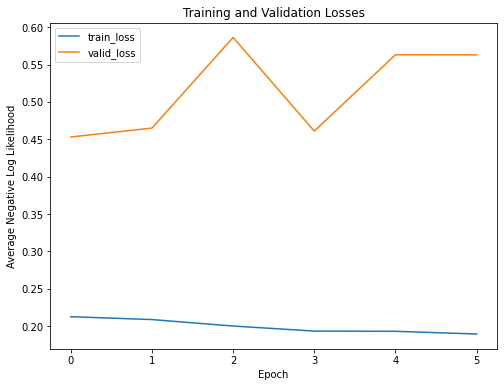

In [37]:
plt.figure(figsize=(8, 6))
for c in ['train_loss', 'valid_loss']:
    plt.plot(
        history[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Negative Log Likelihood')
plt.title('Training and Validation Losses')

<Figure size 576x432 with 0 Axes>

Text(0.5, 0, 'Epoch')

Text(0, 0.5, 'Average Accuracy')

Text(0.5, 1.0, 'Training and Validation Accuracy')

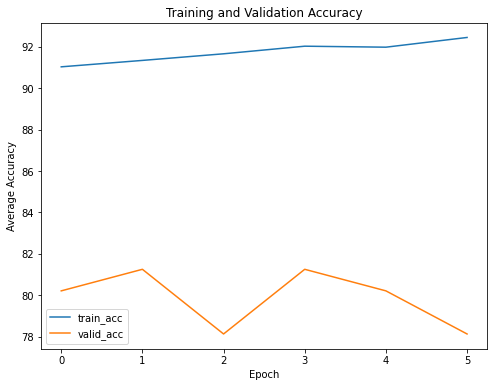

In [38]:
plt.figure(figsize=(8, 6))
for c in ['train_acc', 'valid_acc']:
    plt.plot(
        100 * history[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Accuracy')
plt.title('Training and Validation Accuracy')

- <a href='#7'>7. Saving and loading the model </a>

The train function saves the best model state_dict() which are the weights of the model. To save more information about the model, we use the below function.

In [39]:
def save_checkpoint(model, path):
    """Save a PyTorch model checkpoint

    Params
    --------
        model (PyTorch model): model to save
        path (str): location to save model. Must start with `model_name-` and end in '.pth'

    Returns
    --------
        None, save the `model` to `path`

    """

    model_name = path.split('-')[0]
    assert (model_name in ['vgg16', 'resnet50'
                           ]), "Path must have the correct model name"

    # Basic details
    checkpoint = {
        'class_to_idx': model.class_to_idx,
        'idx_to_class': model.idx_to_class,
        'epochs': model.epochs,
    }

    # Extract the final classifier and the state dictionary
    if model_name == 'vgg16':
        # Check to see if model was parallelized
        if multi_gpu:
            checkpoint['classifier'] = model.module.classifier
            checkpoint['state_dict'] = model.module.state_dict()
        else:
            checkpoint['classifier'] = model.classifier
            checkpoint['state_dict'] = model.state_dict()

    elif model_name == 'resnet50':
        if multi_gpu:
            checkpoint['fc'] = model.module.fc
            checkpoint['state_dict'] = model.module.state_dict()
        else:
            checkpoint['fc'] = model.fc
            checkpoint['state_dict'] = model.state_dict()

    # Add the optimizer
    checkpoint['optimizer'] = model.optimizer
    checkpoint['optimizer_state_dict'] = model.optimizer.state_dict()

    # Save the data to the path
    torch.save(checkpoint, path)

In [40]:
save_checkpoint(model, path=checkpoint_path)

**Loading the model**

In [41]:
def load_checkpoint(path):
    

    # Get the model name
    model_name = path.split('-')[0]
    assert (model_name in ['vgg16', 'resnet50'
                           ]), "Path must have the correct model name"

    # Load in checkpoint
    checkpoint = torch.load(path)

    if model_name == 'vgg16':
        model = models.vgg16(pretrained=True)
        # Make sure to set parameters as not trainable
        for param in model.parameters():
            param.requires_grad = False
        model.classifier = checkpoint['classifier']

    elif model_name == 'resnet50':
        model = models.resnet50(pretrained=True)
        # Make sure to set parameters as not trainable
        for param in model.parameters():
            param.requires_grad = False
        model.fc = checkpoint['fc']

    # Load in the state dict
    model.load_state_dict(checkpoint['state_dict'])

    total_params = sum(p.numel() for p in model.parameters())
    print(f'{total_params:,} total parameters.')
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f'{total_trainable_params:,} total gradient parameters.')

    # Move to gpu
    if multi_gpu:
        model = nn.DataParallel(model)

    if train_on_gpu:
        model = model.to('cuda')

    # Model basics
    model.class_to_idx = checkpoint['class_to_idx']
    model.idx_to_class = checkpoint['idx_to_class']
    model.epochs = checkpoint['epochs']

    # Optimizer
    optimizer = checkpoint['optimizer']
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

    return model, optimizer
model, optimizer = load_checkpoint(path=checkpoint_path)

if multi_gpu:
    summary(model.module, input_size=(3, 224, 224), batch_size=batch_size)
else:
    summary(model, input_size=(3, 224, 224), batch_size=batch_size)

135,309,890 total parameters.
1,049,346 total gradient parameters.
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1        [128, 64, 224, 224]           1,792
              ReLU-2        [128, 64, 224, 224]               0
            Conv2d-3        [128, 64, 224, 224]          36,928
              ReLU-4        [128, 64, 224, 224]               0
         MaxPool2d-5        [128, 64, 112, 112]               0
            Conv2d-6       [128, 128, 112, 112]          73,856
              ReLU-7       [128, 128, 112, 112]               0
            Conv2d-8       [128, 128, 112, 112]         147,584
              ReLU-9       [128, 128, 112, 112]               0
        MaxPool2d-10         [128, 128, 56, 56]               0
           Conv2d-11         [128, 256, 56, 56]         295,168
             ReLU-12         [128, 256, 56, 56]               0
           Conv2d-13         [128, 2

<a id='7'>7. Making Predictions</a>

Now we will test our model and evaluate Model over all classes.


In [ ]:
test_loader=dataloaders['test']
test_loss = 0.0
class_correct = list(0. for i in range(2))
class_total = list(0. for i in range(2))
classes = [0,1]
model.eval()
model.cpu()
i=1
# iterate over test data
len(test_loader)

for data, target in test_loader:
      i=i+1
      # if len(target)!=batch_size:
      #     continue
          
      # move tensors to GPU if CUDA is available
      if True:
          data, target = data, target
          # forward pass: compute predicted outputs by passing inputs to the model
          output = model(data)
          # calculate the batch loss
          loss = criterion(output, target)
          # update test loss 
          test_loss += loss.item()*data.size(0)
          # convert output probabilities to predicted class
          _, pred = torch.max(output, 1)    
          # compare predictions to true label
          correct_tensor = pred.eq(target.data.view_as(pred))
          correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())
          # calculate test accuracy for each object class
          #     print(target)
      
      for i in range(8):
        # print("Here in loop")      
        label = target.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

# average test loss
test_loss = test_loss/len(test_loader.dataset)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(2):
    if class_total[i] > 0:
        print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
            classes[i], 100 * class_correct[i] / class_total[i],
            np.sum(class_correct[i]), np.sum(class_total[i])))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% ' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    ))

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

468

In [ ]:
print('\nTest Accuracy (Overall): %2d%% ' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    ))

In [1]:
!pip install colab_pdf

ERROR: Could not find a version that satisfies the requirement colab_pdf (from versions: none)
ERROR: No matching distribution found for colab_pdf


In [5]:
!wget -nc https://raw.githubusercontent.com/brpy/colab-pdf/master/colab_pdf.py
from colab_pdf import colab_pdf
colab_pdf('Ppneumonia_detection_using_pytorch (1).ipynb')

File ‘colab_pdf.py’ already there; not retrieving.





[NbConvertApp] Converting notebook /content/drive/MyDrive/Colab Notebooks/Ppneumonia_detection_using_pytorch (1).ipynb to pdf
[NbConvertApp] Support files will be in Ppneumonia_detection_using_pytorch (1)_files/
[NbConvertApp] Making directory ./Ppneumonia_detection_using_pytorch (1)_files
[NbConvertApp] Making directory ./Ppneumonia_detection_using_pytorch (1)_files
[NbConvertApp] Writing 135246 bytes to ./notebook.tex
[NbConvertApp] Building PDF
[NbConvertApp] Running xelatex 3 times: ['xelatex', './notebook.tex', '-quiet']
[NbConvertApp] Running bibtex 1 time: ['bibtex', './notebook']
[NbConvertApp] WARNING | bibtex had problems, most likely because there were no citations
[NbConvertApp] PDF successfully created
[NbConvertApp] Writing 147550 bytes to /content/drive/My Drive/Ppneumonia_detection_using_pytorch (1).pdf


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

'File ready to be Downloaded and Saved to Drive'